# Detection of Manipulated Image pixels 

## 1. Understanding the problem

### 1.1 Problem Statement:

#### 1.     As there are a lot of software tools available for modifying authenticated digital content such as images or videos that leads to spread manipulated information across digital medium, which is also a one of the main reasons for losing the trust against the digital content.


#### 2.     On considering this problem, we can address the solution using some Artificial Intelligence techniques, as there is already active research at this particular area, we can find many exciting solutions to detect given image is manipulated or not, however this approach cannot ensure that which regions in the image are manipulated.  


#### 3.     Realizing this, we are going to build the model so that it can predict manipulated regions at pixel level which is a little more advanced than the normal image classification.    


### 1.2 Objective

#### 	We need to build a model such that for a given any image it should predict the manipulated regions.

### 1.3 Data Source

#### To train and test the algorithms I am considering IEEE IFS-TC Image Forensics Challenge  data that has both authenticated and manipulated images.

#### For every manipulated image we have its corresponding maks that contain only white and black color pixels.


For more understanding of the data, please refer the follwoing link
http://web.archive.org/web/20171013200331/http:/ifc.recod.ic.unicamp.br/fc.website/index.py?sec=5

### 1.4 Performance Metric

#### As per our objective, ideal model should able to detect the mask that has values for manipulated pixels = 0 and for real pixels = 1, here we can measure accuracy and log loss

#### Accuray and log-loss we are measuring at pixel level 

In [1]:
#Importing the necessary modules 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import os 
import cv2
from tqdm import tqdm_notebook as tqdm 
import seaborn as sns
import joblib 
import warnings
import math
import pickle as pk
import datetime
import albumentations
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from imageio import imread
import imageio
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers,Model,Sequential
from tensorflow.keras.layers import Dropout,Activation,InputLayer,LSTM,GRU,Bidirectional,TimeDistributed,Flatten,Dense,BatchNormalization,MaxPooling2D,Conv2D,Input,Concatenate,LeakyReLU
warnings.filterwarnings('ignore')
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical

In [2]:
PATH = 'D:/collage/Sem 4/Intership/dataset-dist/phase-01/training/'

DATASET_PATHS = {
    'real': 'pristine',
    'fake': 'fake'
}

In [3]:
#Sample files names in 'real' images
os.listdir(PATH+DATASET_PATHS['real'])[:10]

['0001d52e2fd94f30c2bca0449763a752.png',
 '000bc3906100ede4b1374cea075adedb.png',
 '002e23c036a05de656242f5ce6ab2e15.png',
 '003f2d6e572e2587ffa809f78ff4a5c4.png',
 '00d56bffe2d757a4e4625cc2d0bd0de9.png',
 '00dd93f9e4af553929e54e66c2a3186e.png',
 '00dffa8cb9db22527454bfa3c03b484b.png',
 '00e079b66d9e9f99892bbb81d9d6cd57.png',
 '00e3659be9c1fec47c739f79252840e3.png',
 '00ec0ffe0cd029ad4551680484a007d7.png']

In [4]:
#Sample files names in 'manipulated' images
os.listdir(PATH+DATASET_PATHS['fake'])[:10]

['.DS_Store',
 '010543abfbd0db1e9aa1b24604336e0c.mask.png',
 '010543abfbd0db1e9aa1b24604336e0c.png',
 '022354380a1a17ff49226c9eae21a11f.mask.png',
 '022354380a1a17ff49226c9eae21a11f.png',
 '0294345b3b2324b195cb3b30e91d7678.mask.png',
 '0294345b3b2324b195cb3b30e91d7678.png',
 '0363353570f16ff0a73aa0a03a7795b8.mask.png',
 '0363353570f16ff0a73aa0a03a7795b8.png',
 '0830004e471e511458600f0763ce19f3.mask.png']

##### Observation: we can see that in 'fake' directory we have both manipulated image and its corresponding masks

#### -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- 

## 2. Exploratory Data Analysis 

#### 1. To get high level deatails, here I am appending all image names, mask names  into two separate data frames along with its shapes

In [5]:
masked_dict  = {'name':[],'height':[], 'width':[], 'channels':[]} 
data_dict = {'name':[],'height':[], 'width':[], 'channels':[],'label':[]} 
#masked_df = pd.DataFrame(columns=['name', 'height', 'width','channels'])

In [6]:

for path in DATASET_PATHS:
    for image in tqdm(os.listdir(PATH+DATASET_PATHS[path])):
        if image.split('.')[-2]=='mask':
            img = imread(PATH+DATASET_PATHS[path]+'/'+image)
            if len(img.shape)==2:
                height, width = img.shape   
                channels = 1
            else:
                height, width, channels = img.shape    
            masked_dict['name'].append(image)
            masked_dict['height'].append(height)
            masked_dict['width'].append(width)
            masked_dict['channels'].append(channels)
        else:
            try:
                img = imread(PATH+DATASET_PATHS[path]+'/'+image)
                if len(img.shape)==2:
                    height, width = img.shape   
                    channels = 1
                else:
                    height, width, channels = img.shape                
            except:
                pass
            data_dict['name'].append(image)
            data_dict['height'].append(height)
            data_dict['width'].append(width)
            data_dict['channels'].append(channels)
            data_dict['label'].append(DATASET_PATHS[path])

  0%|          | 0/1050 [00:00<?, ?it/s]

  0%|          | 0/901 [00:00<?, ?it/s]


1. data_df --> is dataframe that contains all pristine and fake image names,label and its shape
2. masked_df --> is dataframe that contains all mask image names,label and its shape

In [7]:
data_df = pd.DataFrame.from_dict(data_dict)
masked_df = pd.DataFrame.from_dict(masked_dict)

In [8]:
masked_df.head()

,name,height,width,channels
0,010543abfbd0db1e9aa1b24604336e0c.mask.png,1536,2048,4
1,022354380a1a17ff49226c9eae21a11f.mask.png,768,1024,1
2,0294345b3b2324b195cb3b30e91d7678.mask.png,600,800,4
3,0363353570f16ff0a73aa0a03a7795b8.mask.png,765,1024,1
4,0830004e471e511458600f0763ce19f3.mask.png,768,1024,1


In [9]:
data_df.head()

,name,height,width,channels,label
0,0001d52e2fd94f30c2bca0449763a752.png,768,1024,3,pristine
1,000bc3906100ede4b1374cea075adedb.png,768,1024,3,pristine
2,002e23c036a05de656242f5ce6ab2e15.png,768,1024,3,pristine
3,003f2d6e572e2587ffa809f78ff4a5c4.png,768,1024,3,pristine
4,00d56bffe2d757a4e4625cc2d0bd0de9.png,768,1024,3,pristine


In [10]:
data_df.duplicated().any()

False

In [11]:
masked_df.duplicated().any()

False

In [13]:
masked_df.to_csv('masked_df.csv',index=False)
data_df.to_csv('data_df.csv',index=False)
masked_df=pd.read_csv('masked_df.csv')
data_df=pd.read_csv('data_df.csv')

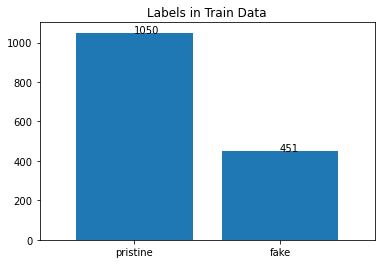

In [14]:
lables= data_df['label'].value_counts()
ax=lables.plot.bar(width=.8,title='Labels in Train Data', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.label, v.label)

#### Observation : Prisitine images are very dominating than fake images

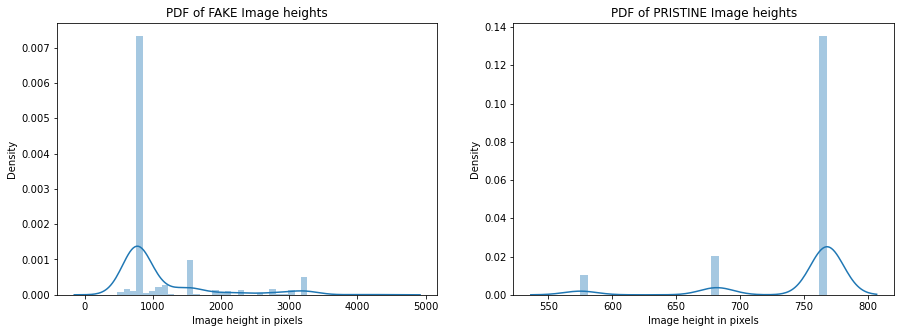

In [15]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_title('PDF of FAKE Image heights')
sns.distplot(data_df[data_df['label']=='fake'].height,ax=ax[0])
ax[0].set_xlabel("Image height in pixels")
#sns.distplot(data_df[data_df['label']=='pristine'].height)
ax[0].set_xlabel("Image height in pixels")
sns.distplot(data_df[data_df['label']=='pristine'].height,ax=ax[1])
#sns.distplot(data_df[data_df['label']=='pristine'].height)
ax[1].set_xlabel("Image height in pixels")
ax[1].set_title('PDF of PRISTINE Image heights')
plt.show()

#### Observation:
1. FAKE Images have more scope for larger height height values than PRISTINE ones.

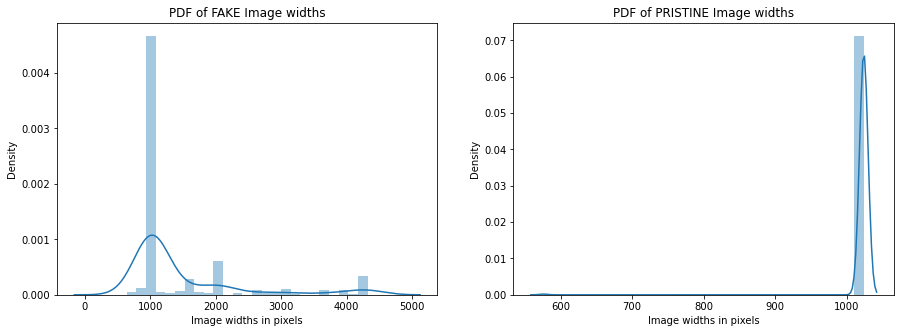

In [16]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_title('PDF of FAKE Image widths')
sns.distplot(data_df[data_df['label']=='fake'].width,ax=ax[0])
ax[0].set_xlabel("Image widths in pixels")
ax[0].set_xlabel("Image widths in pixels")
sns.distplot(data_df[data_df['label']=='pristine'].width,ax=ax[1])
ax[1].set_xlabel("Image widths in pixels")
ax[1].set_title('PDF of PRISTINE Image widths')
plt.show()

#### Observation:

1. A typical width value for PRISTINE image can occur around 1000.
2. Width value for FAKE images has similar PDF as its heights 

In [22]:
# Now Checking the number of channels in images and masks

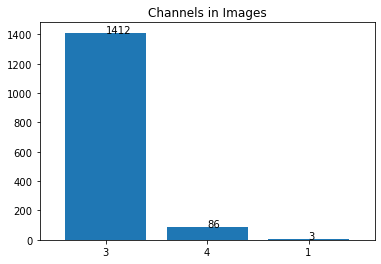

In [17]:
lables= data_df['channels'].value_counts()
ax=lables.plot.bar(width=.8,title='Channels in Images', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.channels, v.channels)

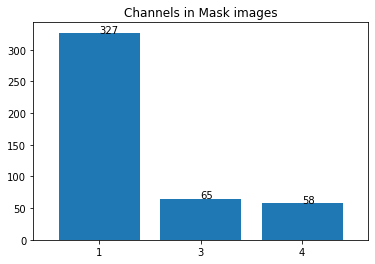

In [18]:
lables= masked_df['channels'].value_counts()
ax=lables.plot.bar(width=.8,title='Channels in Mask images', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.channels, v.channels)

In [23]:
# Let's observe one random sample from PRISTINE image

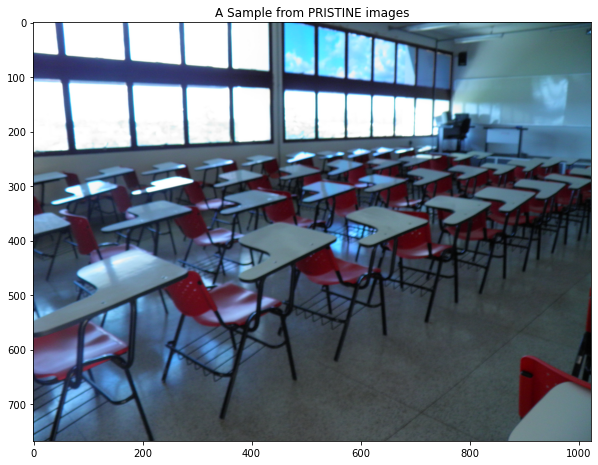

In [19]:
plt.figure(figsize=(10,10))
image = imread(PATH+'pristine'+'/'+(data_df[data_df.label=='pristine']['name']).iloc[120])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.title('A Sample from PRISTINE images')
plt.show()

In [24]:
## Let's observe some random sample FAKE images and its corresponding MASK

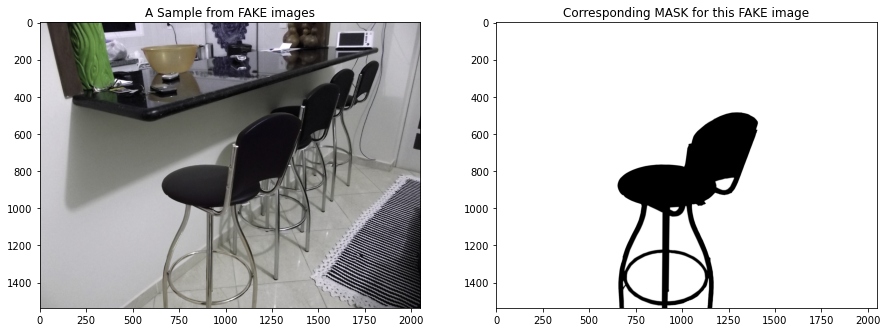

In [20]:
fig, ax = plt.subplots(1,2,figsize=(15,15))
index = 15
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
plt.show()

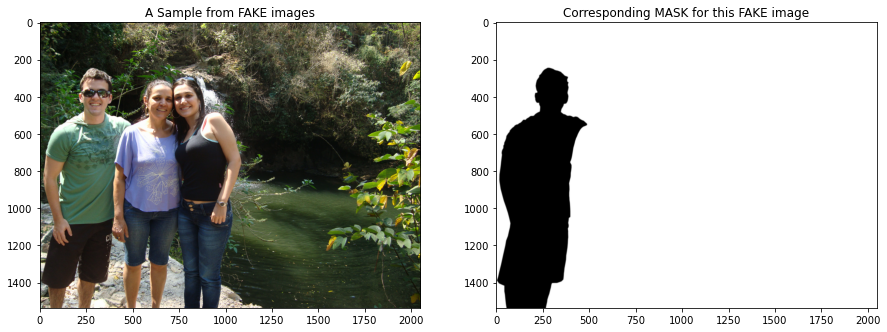

In [21]:
index = 300
fig, ax = plt.subplots(1,2,figsize=(15,15))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
plt.show()

In [22]:
data_df = pd.read_csv('data_df.csv')
masked_df = pd.read_csv('masked_df.csv')

In [23]:
print("Total FAKE images in the data: {}".format(len(set(list(data_df[data_df.label=='fake']['name'])))))
print("Total availble Masks for the data: {}".format(len(set(list(masked_df['name'])))))

Total FAKE images in the data: 451
Total availble Masks for the data: 450


In [24]:
# Taking intersection between fake image names and mask names
fake_names = list(set([i.split('.')[0] for i in list(masked_df['name'])]) & set([i.split('.')[0] for i in list(data_df[data_df.label=='fake']['name'])]))

In [25]:
print("Total intersection of Masks and FAKE images in the data: {}".format(len(fake_names)))

Total intersection of Masks and FAKE images in the data: 450


Also Checking the shape of Fake image and its corresponding masks

if(shape('fake_xx.png')!=shape('mask_xx.mask.png')):


    then delete that fake_xx.png and mask_xx.mask.png

In [26]:
delete_these = []
for image in fake_names:
    mask_img = cv2.imread(PATH+'fake'+'/'+image+'.mask.png')
    fake_img = cv2.imread(PATH+'fake'+'/'+image+'.png')
    if mask_img.shape[:2]!= fake_img.shape[:2]:
        delete_these.append(image)
delete_these       

['cc263a4c9ff9943acbb9049f637a0bed',
 'd9b9f5db7d29a3855cceef574145b595',
 'ca472f184807aded538221ac0b5ac27b',
 'd4aff0ad5f4f99fc6cad4243b926eda7',
 'aa3b4f7caf9de8c1d6551c33045fb4c1',
 'bb7ed6b43f565a1fe2ebcbf99886d1d4',
 'bc04da26ab41ce92565dd3c686dae6c8',
 'b0060704d02f1229b75cbd550c7267b4']

In [27]:
fake_names=list(set(fake_names)-set(delete_these))
print("Total valid masks are :{}".format(len(fake_names)))

Total valid masks are :442


As we have seen  there are mutilple channels are present in some of the mask images;
we are converting them into single channel binary masks by
1. Adding some gaussian blur
2. And modifing the values to either 0 or 255 (0:for black pixels, 255: is for white pixels)



In [30]:
dest_path = PATH+'binary_masks/'
bin_masks =[]
for mask in tqdm(fake_names):
    mask_img = cv2.imread(PATH+'fake'+'/'+mask+'.mask.png')[:,:,:1]
    #mask_img= cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(mask_img,(5,5),0) #Adding gaussian blur
    ret,bin_mask = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU) #modifing the values to either 0 or 255 
    cv2.imwrite(dest_path+mask+'.mask.png',bin_mask)
    bin_masks.append(bin_mask)

  0%|          | 0/442 [00:00<?, ?it/s]

In [26]:
#Comparing the some random fake images with its raw mask and binary mask 

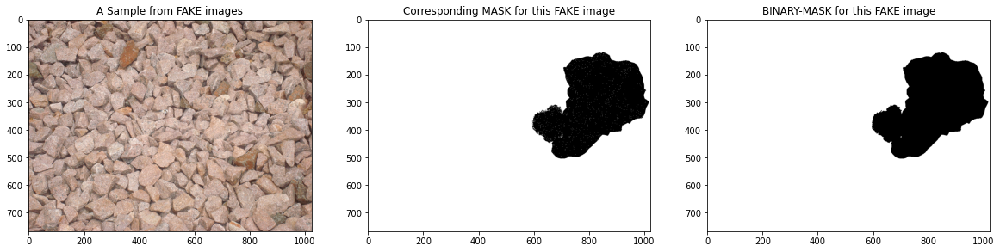

In [31]:
index = 104
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
bin_mask = imread(PATH+'binary_masks/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#bin_mask = cv2.cvtColor(bin_mask, cv2.COLOR_BGR2GRAY)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
ax[2].set_title('BINARY-MASK for this FAKE image')
plt.show()

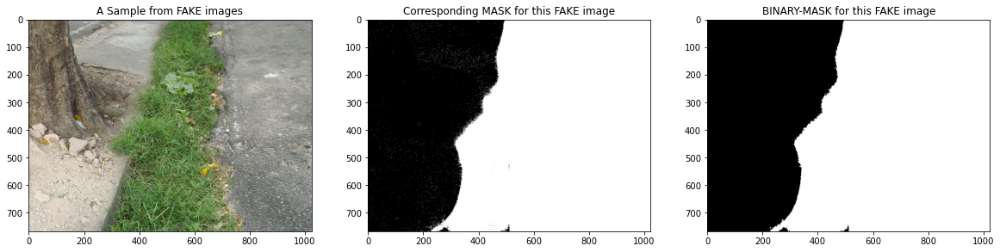

In [32]:
index = 210
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
bin_mask = imread(PATH+'binary_masks/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#bin_mask = cv2.cvtColor(bin_mask, cv2.COLOR_BGR2GRAY)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
ax[2].set_title('BINARY-MASK for this FAKE image')
plt.show()

In [33]:
fake_names[:5]

['d918eeffd78047944ec2d97c4594eb8b',
 'ae9e681d29a063fd86265c1182b64f52',
 'b0a2e857fb69d84cc86e16e53c2feda3',
 'bedffe5f780e3c2be2cc032450ce0800',
 'd2553a38aa5977fedd9c365d6129f83d']

In [34]:
fake_names_df = pd.DataFrame([i+'.png' for i in fake_names],columns=['name'])
data_df_real = data_df[data_df.label == 'pristine']
data_df_fake = data_df[data_df.label == 'fake']

In [35]:
#Deleting unwanted masks and images
data_df_fake = data_df_fake.join(fake_names_df.set_index('name'), on='name',how='right')

In [36]:
data_df_final = pd.concat([data_df_real, data_df_fake], ignore_index=True)

In [37]:
data_df_final.head()

,name,height,width,channels,label
0,0001d52e2fd94f30c2bca0449763a752.png,768,1024,3,pristine
1,000bc3906100ede4b1374cea075adedb.png,768,1024,3,pristine
2,002e23c036a05de656242f5ce6ab2e15.png,768,1024,3,pristine
3,003f2d6e572e2587ffa809f78ff4a5c4.png,768,1024,3,pristine
4,00d56bffe2d757a4e4625cc2d0bd0de9.png,768,1024,3,pristine


In [38]:
# Not Considering invalid mask images and their corresponding fake images
data_df_final.to_csv('data_df_final.csv',index=False)

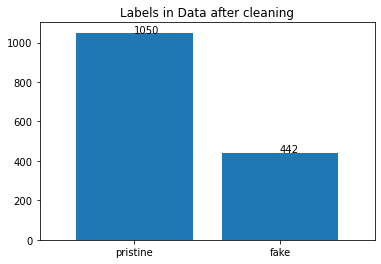

In [39]:
lables= data_df_final['label'].value_counts()
ax=lables.plot.bar(width=.8,title='Labels in Data after cleaning', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.label, v.label)

Finally after all data cleaning above are the counts of the lables in the data.

Now "data_df_final" has details of cleaned data

## 3. Train test split

In [40]:
X_train, X_test, y_train, y_test = train_test_split(data_df_final[['channels', 'height', 'name', 'width','label']],
                                                    data_df_final['label'], 
                                                    test_size=0.2, 
                                                    stratify=data_df_final['label'],
                                                    random_state=42)

In [41]:
X_train, X_val, y_train, y_val = train_test_split(X_train[['channels', 'height', 'name', 'width','label']],
                                                  y_train, test_size=0.2, stratify=y_train,random_state=42)

##### As the available raw data is very low and it is not enough for Learning, we need to upsample the data 

In [42]:
print("........Data splits before the Agumentation...........")
print("Images in Train data before sampling: {} ".format(X_train.shape[0]))
print("Images in Test data  before sampling: {} ".format(X_test.shape[0]))
print("Images in Validation data before sampling: {} ".format(X_val.shape[0]))

........Data splits before the Agumentation...........
Images in Train data before sampling: 954 
Images in Test data  before sampling: 299 
Images in Validation data before sampling: 239 


In [43]:
X_train.to_csv('X_train.csv',index=False)
X_test.to_csv('X_test.csv',index=False)
X_val.to_csv('X_val.csv',index=False)

In [44]:
X_train= pd.read_csv('X_train.csv')
X_test= pd.read_csv('X_test.csv')
X_val= pd.read_csv('X_val.csv')

In [45]:
X_train.head()

,channels,height,name,width,label
0,3,768,1e08e4c90b73a39a63926f9274412066.png,1024,pristine
1,3,680,2d434fc0c848798124376812abd327c8.png,1024,pristine
2,3,680,0f215e9b7f0fbe5c6008d2f094d76df5.png,1024,pristine
3,3,768,1d54c6fef7e338ad400d7a40bcefbc7e.png,1024,pristine
4,3,768,5f61eda73f21bc9c8ed81e6f0f881881.png,1024,pristine


## 4. Data Agumentation

To increase the imapact of RAW data, here we are agumenting the data(separately for train,test and val splits). 

In [46]:
#Ref: https://www.kaggle.com/alexanderliao/image-augmentation-demo-with-albumentation
#Ref : https://albumentations.readthedocs.io/en/latest/api/augmentations.html

from albumentations import (
PadIfNeeded,
HorizontalFlip,
VerticalFlip,
Transpose,
HueSaturationValue,
ElasticTransform,
GridDistortion,
OpticalDistortion,
RandomBrightnessContrast,
RandomGamma,Resize
)

Here I am using albumentations library instead keras agumentor because in this case both source and target images are need to be agumented correspondingly 

In [47]:


def agument(aug,image,mask):
    """This function will apply the type of augmentation on both image and mask
    returns augmented image and its augmented mask
    """
    augmented = aug(image=image, mask=mask)
    return augmented['image'],augmented['mask']


# All these below functions defines the different agumentations types.

def resize(image,mask): #While agumenting the data we are converting all images into the size of (512,512)
    aug = Resize(height=512,width=512,p=1)
    return agument(aug,image,mask)

def horizontalFlip(image,mask):
    aug = HorizontalFlip(p=1)
    return agument(aug,image,mask)
    
def verticalFlip(image,mask):
    aug = VerticalFlip(p=1)
    return agument(aug,image,mask)

def transpose(image,mask):
    aug = Transpose(p=1)
    return agument(aug,image,mask) 

def hueSaturationValue(image,mask):
    aug = HueSaturationValue(p=1,hue_shift_limit=100, sat_shift_limit=100, val_shift_limit=50)
    return agument(aug,image,mask)

def elasticTransform(image,mask):
    aug = ElasticTransform(p=1)
    return agument(aug,image,mask)

def opticalDistortion(image,mask):
    aug = OpticalDistortion(p=1, distort_limit=3, shift_limit=0.4)
    return agument(aug,image,mask)

def randomBrightnessContrast(image,mask):
    aug =RandomBrightnessContrast(p=1,brightness_limit=0.5, contrast_limit=0.4)
    return agument(aug,image,mask)

In [29]:
# Checking data agumentation for single random image,

# While agumenting the data we are converting all images into the size of (512,512)

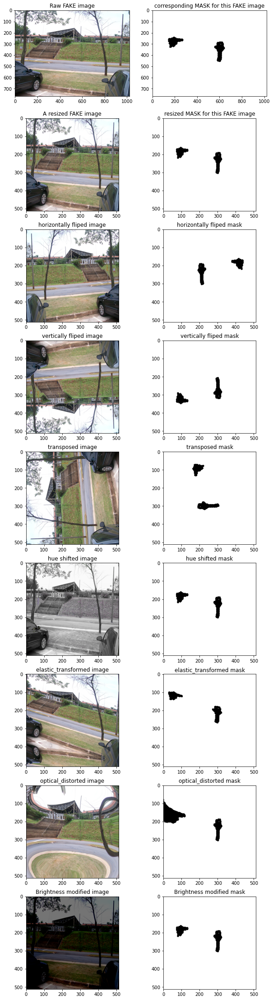

In [48]:
# Checking data agumentation for single random image
index=31
fig, ax = plt.subplots(9,2,figsize=(10,40))
image_raw= imread(PATH+'fake/'+X_train[X_train['label']=='fake']['name'].iloc[index])
mask_raw = imread(PATH+'binary_masks/'+X_train[X_train['label']=='fake']['name'].iloc[index].split('.')[0]+'.mask.png')

image,mask= resize(image=image_raw,mask=mask_raw)
image_h,mask_h= horizontalFlip(image=image,mask=mask)
image_v,mask_v= verticalFlip(image=image,mask=mask)
image_t,mask_t= transpose(image=image,mask=mask)
image_hue,mask_hue= hueSaturationValue(image=image,mask=mask)
image_elt,mask_elt= elasticTransform(image=image,mask=mask)
image_opt,mask_opt= opticalDistortion(image=image,mask=mask)
image_rbc,mask_rbc= randomBrightnessContrast(image=image,mask=mask)

ax[0][0].imshow(image_raw)
ax[0][1].imshow(mask_raw,cmap='gray')
ax[0][0].set_title('Raw FAKE image')
ax[0][1].set_title('corresponding MASK for this FAKE image')
ax[1][0].imshow(image)
ax[1][1].imshow(mask,cmap='gray')
ax[1][0].set_title('A resized FAKE image')
ax[1][1].set_title('resized MASK for this FAKE image')
ax[2][0].imshow(image_h)
ax[2][1].imshow(mask_h,cmap='gray')
ax[2][0].set_title('horizontally fliped image')
ax[2][1].set_title('horizontally fliped mask')
ax[3][0].imshow(image_v)
ax[3][1].imshow(mask_v,cmap='gray')
ax[3][0].set_title('vertically fliped image')
ax[3][1].set_title('vertically fliped mask')
ax[4][0].imshow(image_t)
ax[4][1].imshow(mask_t,cmap='gray')
ax[4][0].set_title('transposed image')
ax[4][1].set_title('transposed mask')
ax[5][0].imshow(image_hue)
ax[5][1].imshow(mask_hue,cmap='gray')
ax[5][0].set_title('hue shifted image')
ax[5][1].set_title('hue shifted mask')
ax[6][0].imshow(image_elt)
ax[6][1].imshow(mask_elt,cmap='gray')
ax[6][0].set_title('elastic_transformed image')
ax[6][1].set_title('elastic_transformed mask')
ax[7][0].imshow(image_opt)
ax[7][1].imshow(mask_opt,cmap='gray')
ax[7][0].set_title('optical_distorted image')
ax[7][1].set_title('optical_distorted mask')
ax[8][0].imshow(image_rbc)
ax[8][1].imshow(mask_rbc,cmap='gray')
ax[8][0].set_title('Brightness modified image')
ax[8][1].set_title('Brightness modified mask')
plt.show()

In [30]:
# We extend the same idea to all fake images in all splits

In [49]:
train_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/train/fake/'
test_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/test/fake/'
val_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/val/fake/'
os.makedirs(train_path_fk)
os.makedirs(test_path_fk)
os.makedirs(val_path_fk)

In [53]:
def DataAgument(split_type,Type):
    for name in tqdm(split_type[split_type['label']=='fake']['name']):
        name_path = PATH+'fake/'+str(name)
        image_raw= imread(name_path)  
        mask_raw = imread(PATH+'binary_masks/'+name.split('.')[0]+'.mask.png')
        image_0,mask_0= resize(image=image_raw,mask=mask_raw)
        image_1,mask_1= horizontalFlip(image=image_0,mask=mask_0)
        image_2,mask_2= verticalFlip(image=image_0,mask=mask_0)
        image_3,mask_3= transpose(image=image_0,mask=mask_0)
        image_5,mask_5= elasticTransform(image=image_0,mask=mask_0)
        image_6,mask_6= opticalDistortion(image=image_0,mask=mask_0)
        image_7,mask_7= randomBrightnessContrast(image=image_0,mask=mask_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(0)+'.mask.png',mask_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(1)+'.mask.png',mask_1)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(2)+'.png',image_2)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(2)+'.mask.png',mask_2)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(3)+'.png',image_3)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(3)+'.mask.png',mask_3)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(5)+'.png',image_5)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(5)+'.mask.png',mask_5)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(6)+'.png',image_6)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(6)+'.mask.png',mask_6)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(7)+'.png',image_7)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(7)+'.mask.png',mask_7)

In [54]:
DataAgument(split_type=X_train,Type="train")
DataAgument(split_type=X_test,Type="test")
DataAgument(split_type=X_val,Type="val")

  0%|          | 0/282 [00:00<?, ?it/s]

In [50]:
print("Total agumented FAKE images from TRIAN Split: {}".format(len(os.listdir(train_path_fk))/2))
print("Total agumented FAKE images from TEST Split: {}".format(len(os.listdir(test_path_fk))/2))
print("Total agumented FAKE images from VALIDATION Split: {}".format(len(os.listdir(val_path_fk))/2))

Total agumented FAKE images from TRIAN Split: 2256.0
Total agumented FAKE images from TEST Split: 712.0
Total agumented FAKE images from VALIDATION Split: 568.0


##### We donot have any masks for pristine images, so we are considering default white mask for all PRISTINE images

In [277]:
train_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/train/pristine/'
test_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/test/pristine/'
val_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/val/pristine/'
os.makedirs(train_path_pr)
os.makedirs(test_path_pr)
os.makedirs(val_path_pr)

In [31]:
#Default white mask with same size as image size which is same for all pristine images
cv2.imwrite("default.mask.png",np.zeros((512,512))+255)

True

In [306]:
def DataAgument_pristine(split_type,Type):
    for name in tqdm(split_type[split_type['label']=='pristine']['name']):
        name_path = PATH+'pristine/'+str(name)
        image_raw= imread(name_path) 
        mask_raw= imread('default.mask.png') 
        image_0,mask_0= resize(image=image_raw,mask=mask_raw)
        image_1,mask_1= verticalFlip(image=image_0,mask=mask_raw)
        #image_2,mask_2= hueSaturationValue(image=image_0,mask=mask_raw)
        image_2,mask_2= opticalDistortion(image=image_0,mask=mask_raw)
        cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
        cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)
        #cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(2)+'.png',image_2)        
        cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(3)+'.png',image_2)

In [307]:
DataAgument_pristine(split_type=X_train,Type="train")
DataAgument_pristine(split_type=X_test,Type="test")
DataAgument_pristine(split_type=X_val,Type="val")

#### Using data Agumention, we reduced the data imabalanceness between Fake and Prisitine images (counts are below)

In [50]:
print("Total agumented FAKE images from TRIAN Split: {}".format(len(os.listdir(train_path_fk))/2))
print("Total agumented FAKE images from TEST Split: {}".format(len(os.listdir(test_path_fk))/2))
print("Total agumented FAKE images from VALIDATION Split: {}".format(len(os.listdir(val_path_fk))/2))

Total agumented FAKE images from TRIAN Split: 2256.0
Total agumented FAKE images from TEST Split: 712.0
Total agumented FAKE images from VALIDATION Split: 568.0


In [49]:
print("Total agumented Pristine images from TRIAN Split: {}".format(len(os.listdir(train_path_pr))))
print("Total agumented Pristine images from TEST Split: {}".format(len(os.listdir(test_path_pr))))
print("Total agumented Pristine images from VALIDATION Split: {}".format(len(os.listdir(val_path_pr))))

Total agumented Pristine images from TRIAN Split: 2016
Total agumented Pristine images from TEST Split: 630
Total agumented Pristine images from VALIDATION Split: 504


In [6]:
train_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/train/fake/'
test_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/test/fake/'
val_path_fk = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/val/fake/'
train_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/train/pristine/'
test_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/test/pristine/'
val_path_pr = 'D:/collage/Sem 4/Intership/Image-forgery-localization-IFL-using-UNET-architecture-master/data_agumented/val/pristine/'

For all data splits,
we are taking the new data frames with columns 'X' and 'y'


where 'X' contains image path
      'y' contains its corresponding mask path

In [43]:
train_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(train_path_fk)})):
    X_label.append(train_path_fk+i+'.png')
    y_label.append(train_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(train_path_pr)})):
    X_label.append(train_path_pr+i+'.png')
    y_label.append('default.mask.png')    

train_data['X']  =  X_label 
train_data['y']  =  y_label 
train_data = shuffle(train_data)
train_data.reset_index(inplace=True, drop=True)
train_data.head()

,X,y
0,data_agumented/train/pristine/7ab599bd4a1f1d6d...,default.mask.png
1,data_agumented/train/pristine/1ffcceddbb7678d3...,default.mask.png
2,data_agumented/train/pristine/3d4cadd27ab1dddb...,default.mask.png
3,data_agumented/train/fake/229f447c1a26a74005b3...,data_agumented/train/fake/229f447c1a26a74005b3...
4,data_agumented/train/pristine/5ad5b5d6ed55c721...,default.mask.png


In [44]:
train_data.shape

(4272, 2)

In [52]:
test_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(test_path_fk)})):
    X_label.append(test_path_fk+i+'.png')
    y_label.append(test_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(test_path_pr)})):
    X_label.append(test_path_pr+i+'.png')
    y_label.append('default.mask.png')    

test_data['X']  =  X_label 
test_data['y']  =  y_label 
test_data = shuffle(test_data)
test_data.reset_index(inplace=True, drop=True)
test_data.head()

,X,y
0,data_agumented/test/fake/b35d925d02a6792e66e47...,data_agumented/test/fake/b35d925d02a6792e66e47...
1,data_agumented/test/fake/d321ba188146edd239c26...,data_agumented/test/fake/d321ba188146edd239c26...
2,data_agumented/test/fake/a2e715a637a43b33199c0...,data_agumented/test/fake/a2e715a637a43b33199c0...
3,data_agumented/test/pristine/03eb1b6719ad68a5e...,default.mask.png
4,data_agumented/test/fake/b50643fbceb9221486cad...,data_agumented/test/fake/b50643fbceb9221486cad...


In [54]:
test_data.shape

(1342, 2)

In [55]:
val_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(val_path_fk)})):
    X_label.append(val_path_fk+i+'.png')
    y_label.append(val_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(val_path_pr)})):
    X_label.append(val_path_pr+i+'.png')
    y_label.append('default.mask.png')    

val_data['X']  =  X_label 
val_data['y']  =  y_label 
val_data = shuffle(val_data)
val_data.reset_index(inplace=True, drop=True)
val_data.head()

,X,y
0,data_agumented/val/pristine/0d20e86dad11f0bd9c...,default.mask.png
1,data_agumented/val/pristine/3c4141c3fb510f0077...,default.mask.png
2,data_agumented/val/pristine/5bf1accded699808b3...,default.mask.png
3,data_agumented/val/fake/a9667850a5652972443b76...,data_agumented/val/fake/a9667850a5652972443b76...
4,data_agumented/val/fake/12362143f7e114beeb9d22...,data_agumented/val/fake/12362143f7e114beeb9d22...


In [56]:
train_data.to_csv('train_data.csv',index="False")
test_data.to_csv('test_data.csv',index="False")
val_data.to_csv('val_data.csv',index="False")

In [7]:
train_data=pd.read_csv('train_data.csv')
test_data=pd.read_csv('test_data.csv')
val_data=pd.read_csv('val_data.csv')

In [8]:
# Defining our own custom data generators  

In [9]:
def data_gen(data):
    while True:
        for start in range(0, data.shape[0], batch_size):
            x_batch = []
            y_batch = []
            end = min(start + batch_size, data.shape[0])
            x_data_batch = data.iloc[start:end]
            
            for index,row in x_data_batch.iterrows():
                image = load_img(row['X'])
                image = img_to_array(image)
                mask = imread(row['y'])
                mask= img_to_array(mask,dtype=np.uint8)
                x_batch.append(image)
                y_batch.append(mask)
            
            x_batch = np.array(x_batch).reshape(-1, 512, 512, 3)/255
            y_batch = np.array(y_batch)/255
            yield x_batch, y_batch
            

## 5. Modeling

Choosing U-net architecture as a base model as it has already proven results on predicting the masks

References:
1. https://arxiv.org/pdf/1505.04597.pdf
2. https://www.depends-on-the-definition.com/unet-keras-segmenting-images/


In [2]:
#Ref : https://www.depends-on-the-definition.com/unet-keras-segmenting-images/

def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

In [3]:
def get_unet(input_img, n_filters=16, dropout=0.5, batchnorm=True):
    # contracting path
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
    # expansive path
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [4]:
input_img = Input((512, 512, 3))
model_unet = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model_unet.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])
model_unet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 512, 512, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 512, 512, 16) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [16]:
checkPoint_path = "model_checkpoints/model_unet/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_unet\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [ ]:
batch_size = 16
max_epochs = 10
input_size = 512

history = model_unet.fit(x = data_gen(train_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_gen(val_data),
                    validation_steps=16,
                    callbacks=callbacks_list)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 16 steps, validate for 16 steps
Epoch 1/10
15/16 [===========================>..] - ETA: 55s - loss: 0.4614 - accuracy: 0.9159 
Epoch 00001: val_accuracy improved from -inf to 0.60569, saving model to model_checkpoints/model_unet/weights-improvement-01-0.61.hdf5
16/16 [==============================] - 968s 61s/step - loss: 0.4579 - accuracy: 0.9176 - val_loss: 0.7012 - val_accuracy: 0.6057
Epoch 2/10
15/16 [===========================>..] - ETA: 50s - loss: 0.3592 - accuracy: 0.9562 
Epoch 00002: val_accuracy improved from 0.60569 to 0.92316, saving model to model_checkpoints/model_unet/weights-improvement-02-0.92.hdf5
16/16 [==============================] - 898s 56s/step - loss: 0.3545 - accuracy: 0.9584 - val_loss: 0.3757 - val_accuracy: 0.9232
Epoch 3/10
15/16 [===========================>..] - ETA: 55s - loss: 0.2940 - accuracy: 0.9625 
Epoch 00003: val_accuracy improved from 0.92316 to 0.96580, saving model to model_che

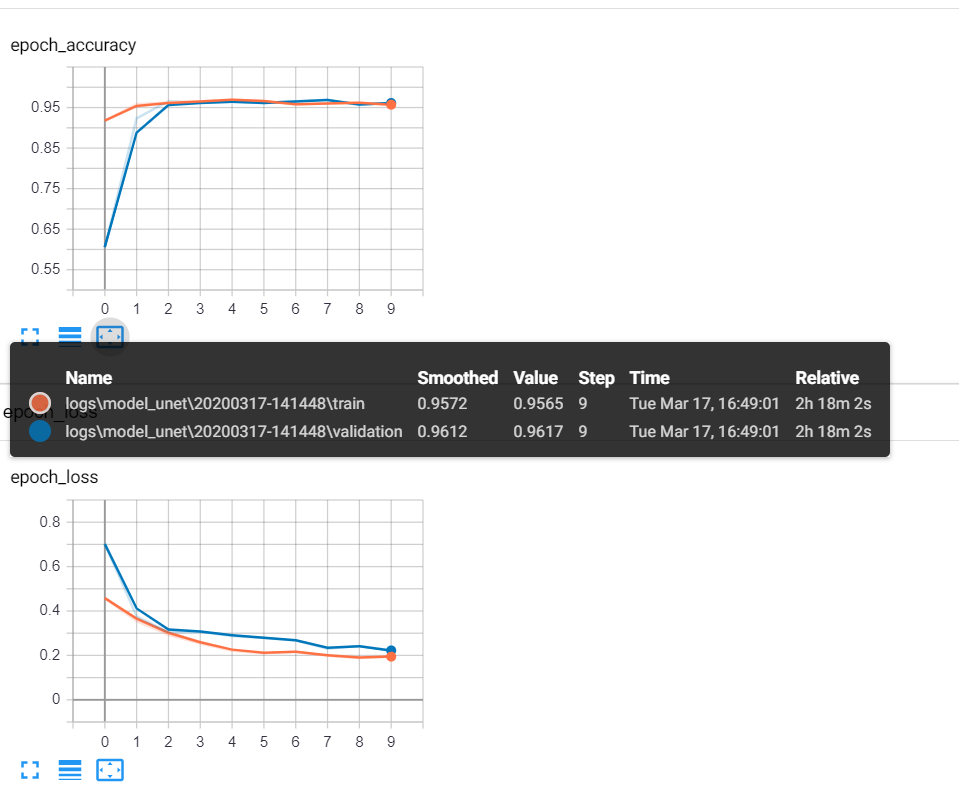

In [ ]:
model_unet.save('trained_models/model_unet.h5')

In [20]:
test_loss,test_accuracy = model_unet.evaluate_generator(data_gen(test_data),steps=16,verbose=1)
val_loss,val_accuracy = model_unet.evaluate_generator(data_gen(val_data),steps=16,verbose=1)
train_loss,train_accuracy = model_unet.evaluate_generator(data_gen(train_data),steps=16,verbose=1)

Instructions for updating:
Please use Model.evaluate, which supports generators.
  ...
    to  
  ['...']
16/16 [==============================] - 59s 4s/step - loss: 0.1975 - accuracy: 0.9749
  ...
    to  
  ['...']
16/16 [==============================] - 60s 4s/step - loss: 0.2351 - accuracy: 0.9548
  ...
    to  
  ['...']
16/16 [==============================] - 61s 4s/step - loss: 0.2194 - accuracy: 0.9619


In [21]:
print("Accuracy on TRAIN Data = {} \t Log-loss in TRAIN Data = {} ".format(train_accuracy,train_loss))
print("Accuracy on VALIDATION Data = {} \t Log-loss in VALIDATION Data = {} ".format(val_accuracy,val_loss))
print("Accuracy on TEST Data = {} \t Log-loss in TEST Data = {} ".format(test_accuracy,test_loss))

Accuracy on TRAIN Data = 0.9619188904762268 	 Log-loss in TRAIN Data = 0.21942212339490652 
Accuracy on VALIDATION Data = 0.9548415541648865 	 Log-loss in VALIDATION Data = 0.23510106932371855 
Accuracy on TEST Data = 0.9749062061309814 	 Log-loss in TEST Data = 0.19747828971594572 


#### We can realize very good accuracy score on TEST split,  Lets predict and print some random test images using trained model

In [91]:
def print_results(model_path,split_data_df,show_images=10):
    """This function prints the input image,its ground truth mask along with predicted mask
        model_path : Takes the path of trianed model
        split_data_df : Takes the pd.DataFrame object that should contain image path and mask path in X and Y named columns
        show_images : number of random images that should sampled from "split_data_df"
    """
    samples = split_data_df.sample(n=show_images)
    model = load_model(model_path)
    input_img = []
    GT_mask = []
    Predicted_mask = []
    for index,row in samples.iterrows():
        image = load_img(row['X'])
        image_arr = img_to_array(image)
        image_arr=np.array(image_arr).reshape(-1, 512, 512, 3)/255
        mask = imread(row['y'])
        output = model.predict(image_arr).reshape(512, 512)
        input_img.append(image)
        GT_mask.append(mask)
        Predicted_mask.append(output)
        
    for i in range(show_images):
        fig, ax = plt.subplots(1,3,figsize=(15, 10))   
        ax[0].imshow(input_img[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(Predicted_mask[i])
        ax[1].set_title("Predicted Mask")
        ax[2].imshow(GT_mask[i])
        ax[2].set_title("Groud Truth Mask")

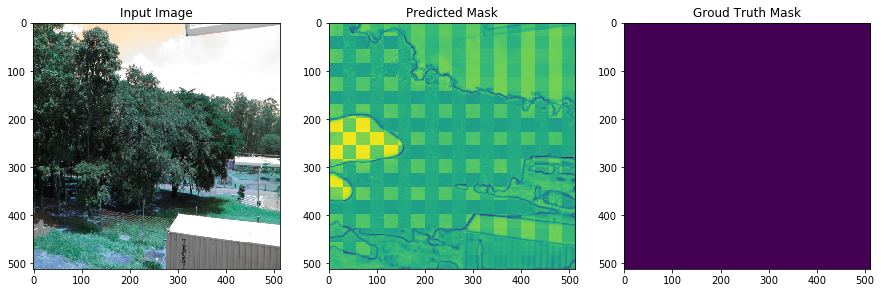

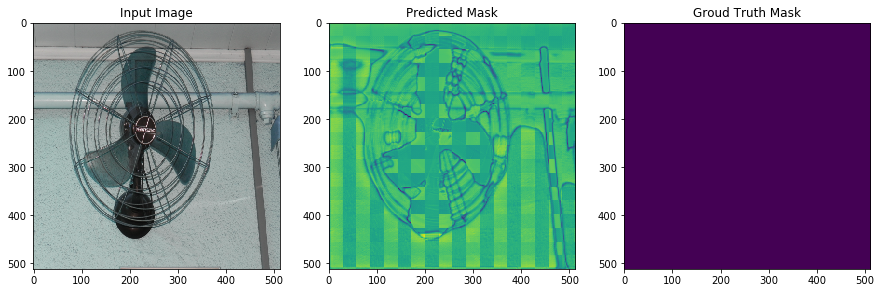

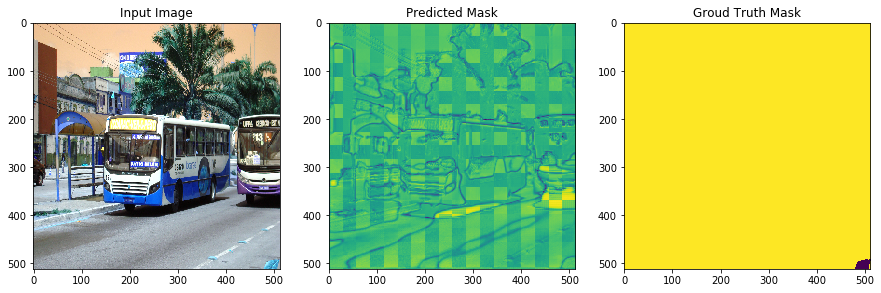

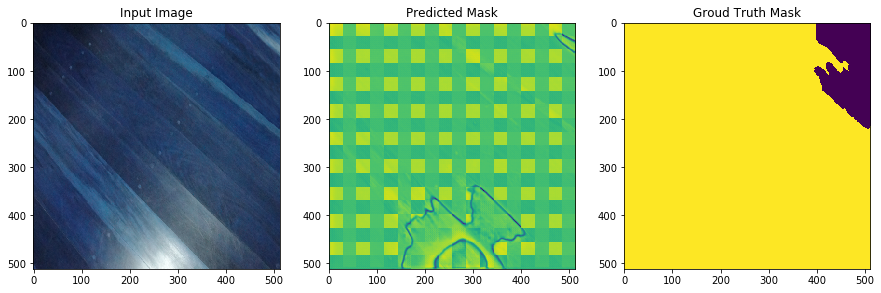

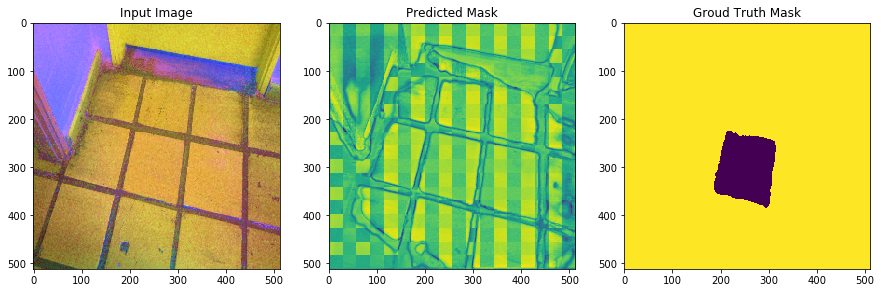

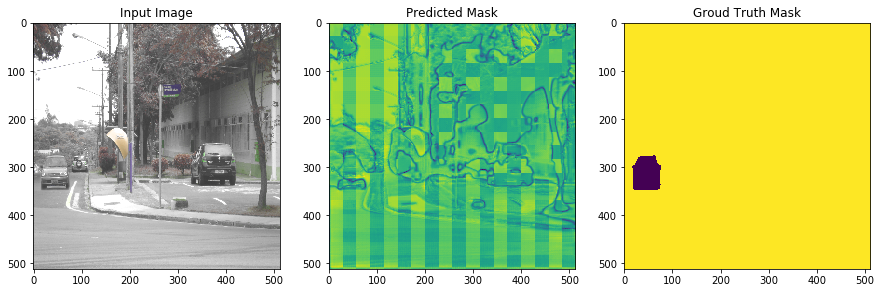

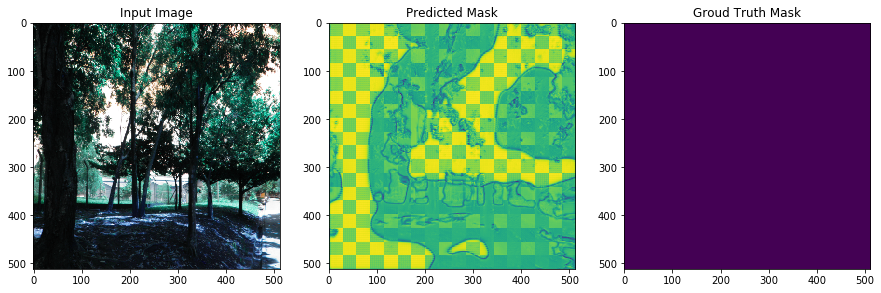

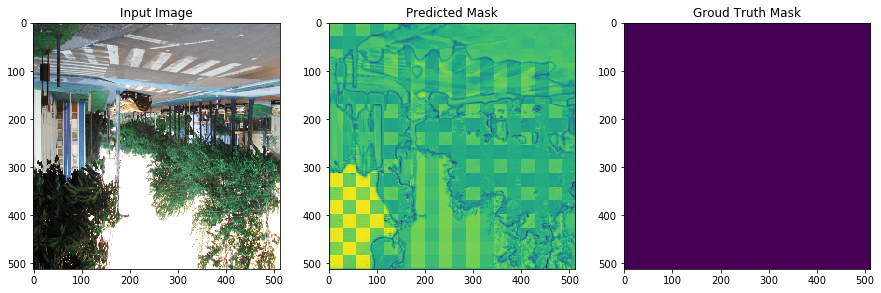

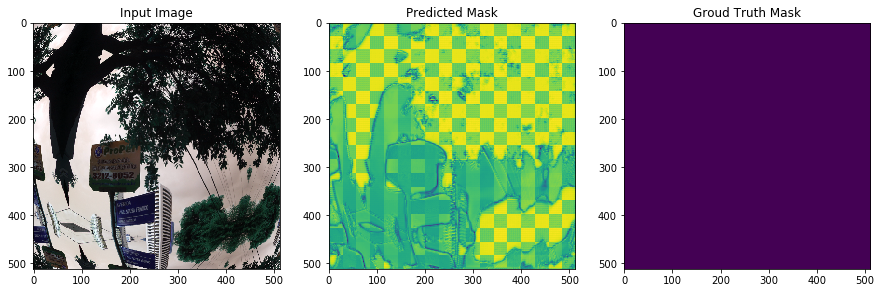

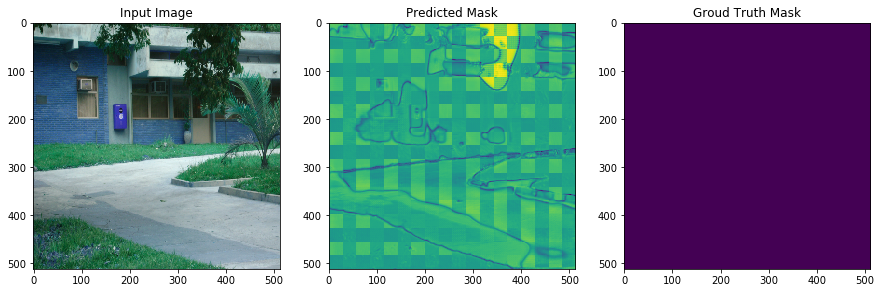

In [59]:
print_results(model_path='trained_models/model_unet.h5',
              split_data_df =test_data,show_images=10)

#### Even though we got good accuracy, there is lot of variation between predicted mask and Ground truth masks.
1. It may be happend because in the data we have contains very less manipulation regions compared to authenticated regions
2. This lead to black pixels have very little impact on  model while it is learning

### As a next step we will train the model by considering only fake images and totally avoiding prisitine images, such that we can try to reduce the imapct of white pixles on model learning

In [60]:
def data_gen_fk(data):
    data_reduced = data[data['y']!='default.mask.png']
    while True:
        for start in range(0, data_reduced.shape[0], batch_size):
            x_batch = []
            y_batch = []
            end = min(start + batch_size, data_reduced.shape[0])
            x_data_batch = data_reduced.iloc[start:end]
            
            for index,row in x_data_batch.iterrows():
                image = load_img(row['X'])
                image = img_to_array(image)
                mask = imread(row['y'])
                mask= img_to_array(mask,dtype=np.uint8)
                x_batch.append(image)
                y_batch.append(mask)
            
            x_batch = np.array(x_batch).reshape(-1, 512, 512, 3)/255
            y_batch = np.array(y_batch)/255

            yield x_batch, y_batch


In [64]:
checkPoint_path = "model_checkpoints/model_unet_fk/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_unet_fk\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [65]:
input_img = Input((512, 512, 3))
model_unet_2 = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model_unet_2.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])
#model_unet_2.summary()

In [66]:
batch_size = 16
max_epochs = 10
input_size = 512

history = model_unet_2.fit_generator(generator = data_gen_fk(train_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_gen_fk(val_data),
                    callbacks=callbacks_list,
                    validation_steps=16)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 16 steps, validate for 16 steps
Epoch 1/10
15/16 [===========================>..] - ETA: 51s - loss: 0.5249 - accuracy: 0.8470 
Epoch 00001: val_accuracy improved from -inf to 0.08105, saving model to model_checkpoints/model_unet_fk/weights-improvement-01-0.08.hdf5
16/16 [==============================] - 911s 57s/step - loss: 0.5183 - accuracy: 0.8529 - val_loss: 45.1796 - val_accuracy: 0.0811
Epoch 2/10
15/16 [===========================>..] - ETA: 49s - loss: 0.4124 - accuracy: 0.9184 
Epoch 00002: val_accuracy did not improve from 0.08105
16/16 [==============================] - 873s 55s/step - loss: 0.4084 - accuracy: 0.9205 - val_loss: 743.1853 - val_accuracy: 0.0782
Epoch 3/10
15/16 [===========================>..] - ETA: 49s - loss: 0.3457 - accuracy: 0.9358 
Epoch 00003: val_accuracy improved from 0.08105 to 0.14491, saving model to model_checkpoints/model_unet_fk/weights-improvement-03-0.14.hdf5
16/16 [==============

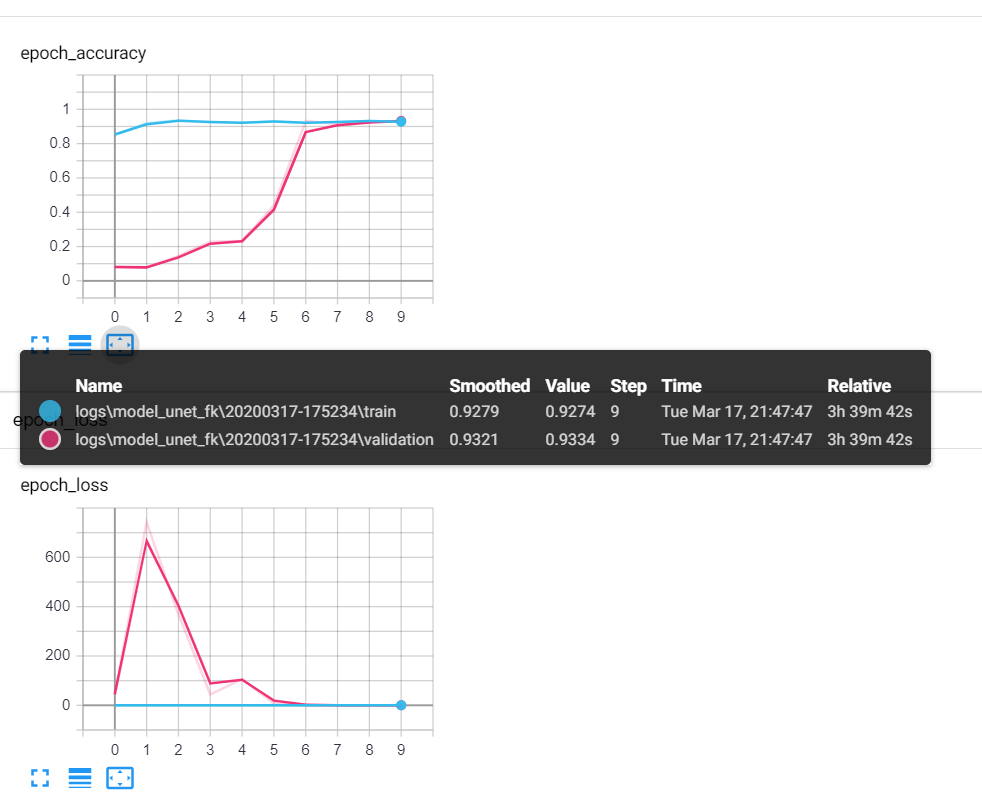

In [67]:
model_unet_2.save('trained_models/model_unet_2.h5')

In [68]:
test_loss_2,test_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(test_data),steps=16,verbose=1)
val_loss_2,val_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(val_data),steps=16,verbose=1)
train_loss_2,train_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(train_data),steps=16,verbose=1)

  ...
    to  
  ['...']
16/16 [==============================] - 81s 5s/step - loss: 0.2384 - accuracy: 0.9536
  ...
    to  
  ['...']
16/16 [==============================] - 81s 5s/step - loss: 0.2946 - accuracy: 0.9232
  ...
    to  
  ['...']
16/16 [==============================] - 75s 5s/step - loss: 0.2796 - accuracy: 0.9303


In [69]:
print("Accuracy on TRAIN Data = {} \t Log-loss in TRAIN Data = {} ".format(train_accuracy_2,train_loss_2))
print("Accuracy on VALIDATION Data = {} \t Log-loss in VALIDATION Data = {} ".format(val_accuracy_2,val_loss_2))
print("Accuracy on TEST Data = {} \t Log-loss in TEST Data = {} ".format(test_accuracy_2,test_loss_2))

Accuracy on TRAIN Data = 0.9302725195884705 	 Log-loss in TRAIN Data = 0.27961766719818115 
Accuracy on VALIDATION Data = 0.9231534004211426 	 Log-loss in VALIDATION Data = 0.29461485613137484 
Accuracy on TEST Data = 0.953616738319397 	 Log-loss in TEST Data = 0.23839154746383429 


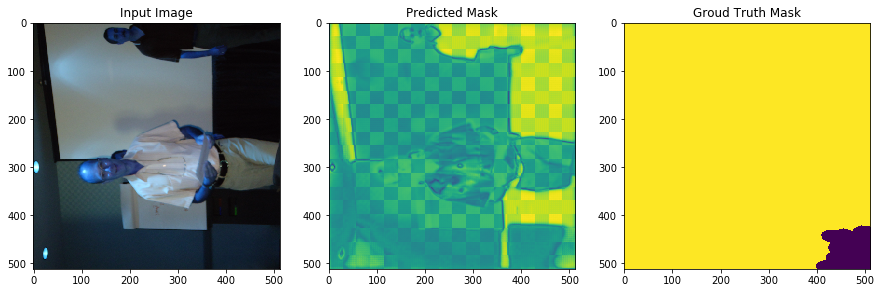

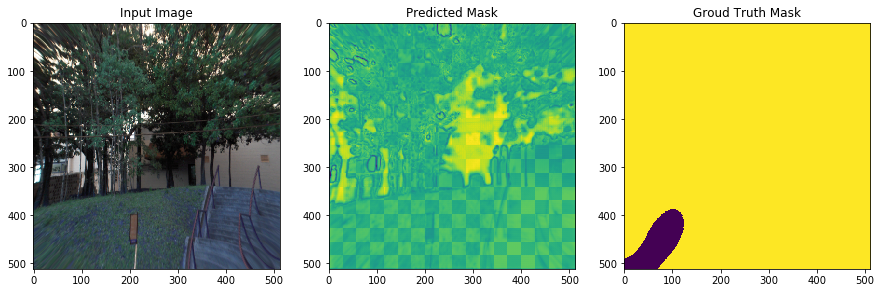

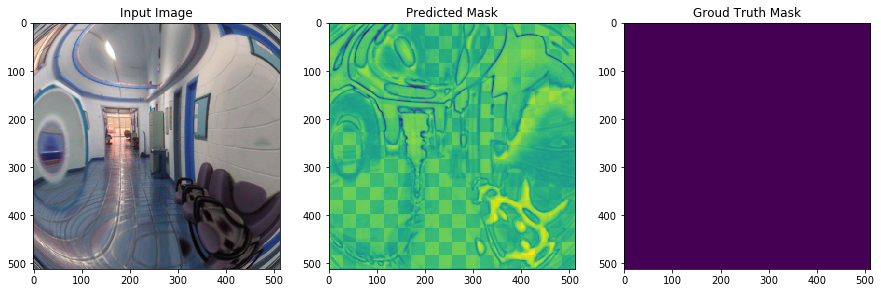

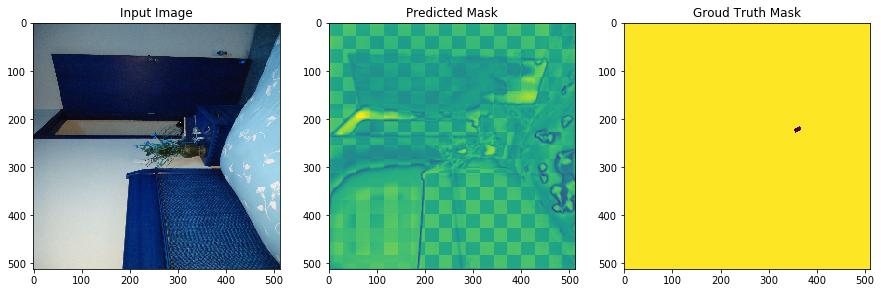

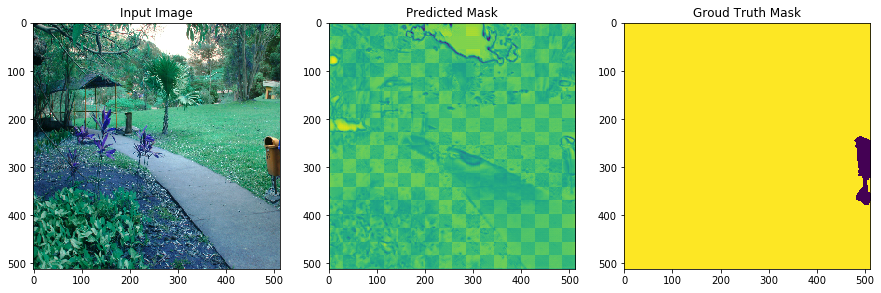

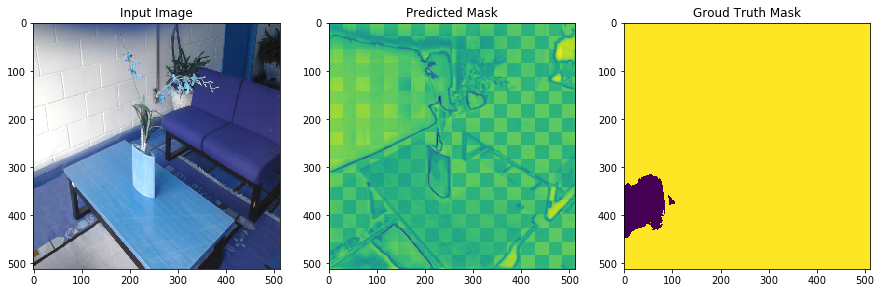

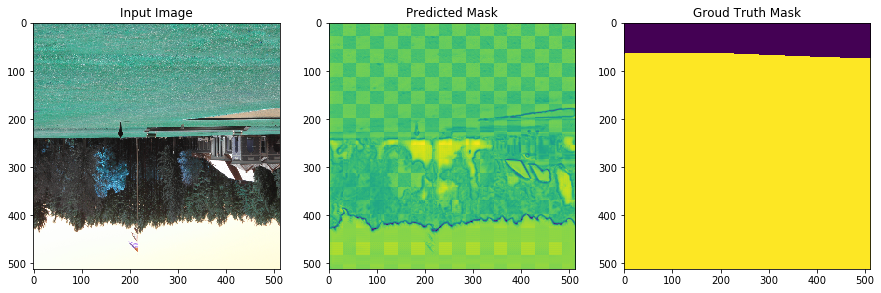

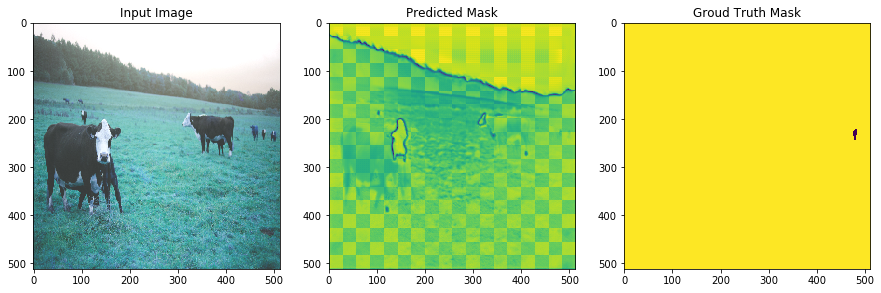

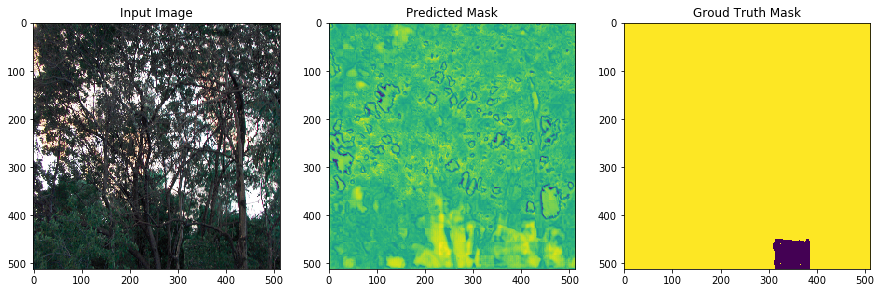

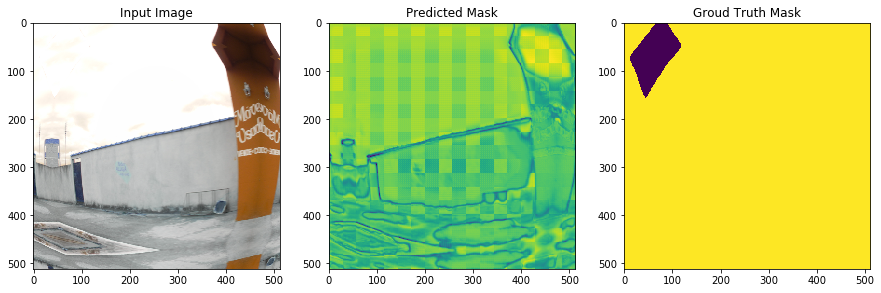

In [70]:
print_results(model_path='trained_models/model_unet_2.h5',
              split_data_df =test_data[test_data['y']!='default.mask.png'],show_images=10)

#### Still the model could not able to predict the mask properly

#### Trying with segmented data 

### Training U-Net with segmented data

1. We will segment the each fake image into 128*128 pixles pateches.
2. We will segemnt the fake image in a way such that each patch will contain atleast 25% of manipulated pixles and authenticated pixles.

We use the below algorithm to get these patches

1. Segment the image with 128 X 128 pixels by using kernal size= 128
2. Move the keranl to next portion in the image using the stride value = 32 and so on iterate on whole image and get patches and its corresponding masked patches 


for each patch in masked patches:

    if (number of white pixels) and (number of black pixels ) > 0.25*128*128
        then save this image patch and its corresponding masked patch 
    

#### Preparing Segmented Data 

In [71]:
train_seg_fk = 'data_segmented/train/fake/'
test_seg_fk = 'data_segmented/test/fake/'
val_seg_fk = 'data_segmented/val/fake/'

In [10]:
if not os.path.isdir('data_segmented'):
    os.makedirs(train_seg_pr)
    os.makedirs(test_seg_pr)
    os.makedirs(val_seg_pr)
    os.makedirs(train_seg_fk)
    os.makedirs(test_seg_fk)
    os.makedirs(val_seg_fk)

In [25]:
PATH = 'dataset-dist/phase-01/training/'
bin_mask_path = PATH+'binary_masks/'

In [45]:
def segment_fakes(image_name,dest, kernel_size=64,stride=32,ret_few_samples=False):
    seg_images=[]
    seg_masks=[]
    image_path = PATH+'fake/'+image_name
    mask_name=image_name.split('.')[0]+'.mask.png'
    mask_path = bin_mask_path+mask_name
    image = imread(image_path)
    mask = imread(mask_path)
    seq_num =0
    for y_start in range(0, image.shape[0]-kernel_size+1, stride):
        for x_start in range(0, image.shape[1]-kernel_size+1, stride):            
            count_whites=np.count_nonzero(mask[y_start:y_start+kernel_size, x_start:x_start+kernel_size])            
            if (count_whites>int(0.25*(kernel_size*kernel_size))) and ((kernel_size*kernel_size)-count_whites>int(0.25*(kernel_size*kernel_size))):
                seq_num = seq_num + 1
                img_seg = image[y_start:y_start+kernel_size, x_start:x_start+kernel_size,:3]
                mask_seg = mask[y_start:y_start+kernel_size, x_start:x_start+kernel_size]
                seg_images.append(img_seg)
                seg_masks.append(mask_seg)
                cv2.imwrite(dest+image_name.split('.')[0]+'_'+str(seq_num)+'.png',img_seg)
                cv2.imwrite(dest+image_name.split('.')[0]+'_'+str(seq_num)+'.mask.png',mask_seg)
    if ret_few_samples:    
        return seg_images,seg_masks

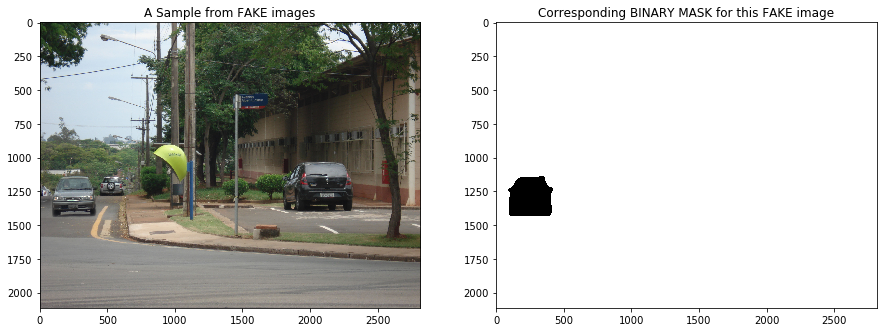

Total samples derived from above fake image using its corresponding Binary MASK: 61


In [52]:
#Checking with one sample random image
index = 20
fig, ax = plt.subplots(1,2,figsize=(15,15))
image = imread( PATH+'/fake/'+data_df_final[data_df_final['label']=='fake']['name'].iloc[index])
mask_image = imread(bin_mask_path+data_df_final[data_df_final['label']=='fake']['name'].iloc[index].split(".")[0]+'.mask.png')
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding BINARY MASK for this FAKE image')
plt.show()

seg_images,seg_masks = segment_fakes(image_name=data_df_final[data_df_final['label']=='fake']['name'].iloc[index],
                     kernel_size=128,
                     dest='/check/',ret_few_samples=True)

print("Total samples derived from above fake image using its corresponding Binary MASK: {}".format(len(seg_images)))


##### Out of all the derived segmeted samples; we are printing only 15 

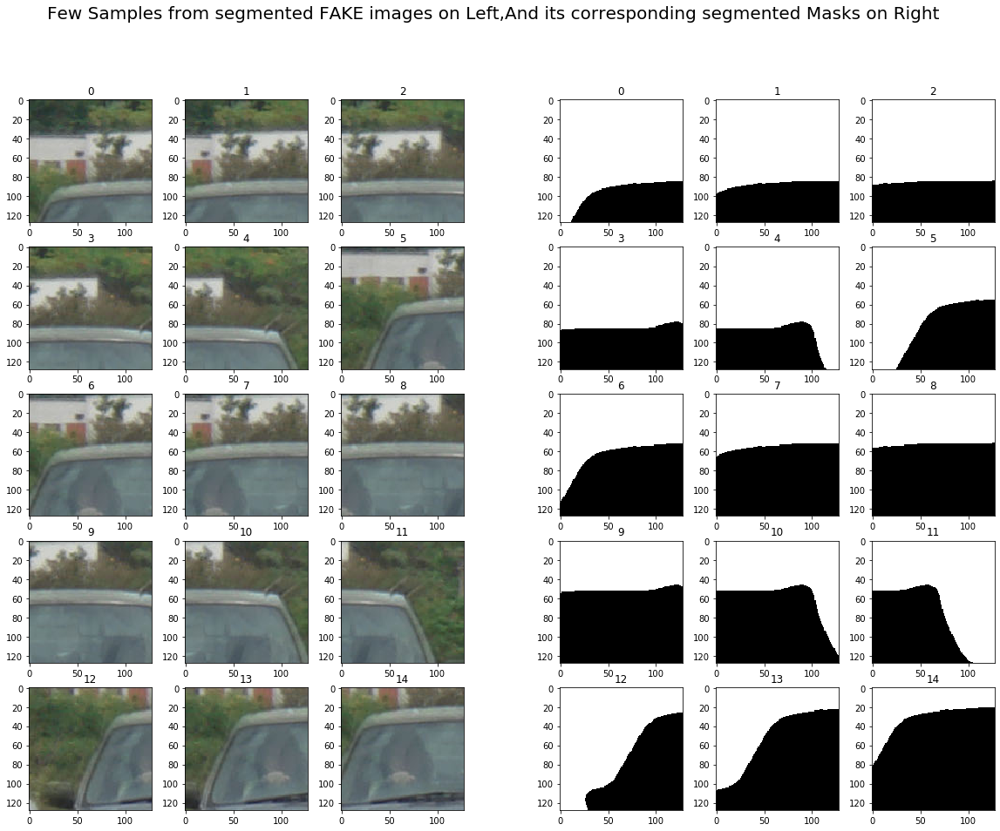

In [76]:
#Reference: https://stackoverflow.com/a/46902866
fig = plt.figure(figsize=(20, 15))
fig.suptitle('Few Samples from segmented FAKE images on Left,And its corresponding segmented Masks on Right ', fontsize=20)
gs0 = gridspec.GridSpec(1, 2)
gs00 = gridspec.GridSpecFromSubplotSpec(5, 3, subplot_spec=gs0[0])
gs01 = gridspec.GridSpecFromSubplotSpec(5, 3, subplot_spec=gs0[1])
m=0
for i in range(5):
    for j in range(3):
        if m==15:
            break
        ax00 = fig.add_subplot(gs00[i, j])
        ax00.imshow(seg_images[m])
        ax00.set_title(str(m))
        ax01 = fig.add_subplot(gs01[i, j])
        ax01.imshow(seg_masks[m],cmap='gray')
        ax01.set_title(str(m))
        m=m+1

In [90]:
def fake_segmet_on_datasplit(dest_path,split_type,kernel_size=64,stride=32):
    for img_name in tqdm(list(split_type[split_type['label']=='fake']['name'])):
        try:
            segment_fakes(image_name=img_name,dest=dest_path,stride=stride,kernel_size=kernel_size)
        except AttributeError:
            pass

#### Segmenting Train,Test and Validation splits with size = 128  using stride = 32

In [91]:
fake_segmet_on_datasplit(dest_path=train_seg_fk,
                         split_type=X_train,
                         kernel_size=128,stride=32)

In [92]:
fake_segmet_on_datasplit(dest_path=val_seg_fk,
                         split_type=X_val,
                         kernel_size=128,stride=32)

In [93]:
fake_segmet_on_datasplit(dest_path=test_seg_fk,
                         split_type=X_test,
                         kernel_size=128,stride=32)

In [100]:
print("Total segmented samples derived from FAKE images from TRIAN DATA: {}".format(len(os.listdir(train_seg_fk))/int(2)))
print("Total segmented samples derived from FAKE images from TEST DATA: {}".format(len(os.listdir(test_seg_fk))/int(2)))
print("Total segmented samples derived from FAKE images from VALIDATION DATA: {}".format(len(os.listdir(val_seg_fk))/int(2)))

Total segmented samples derived from FAKE images from TRIAN DATA: 14353.0
Total segmented samples derived from FAKE images from TEST DATA: 3903.0
Total segmented samples derived from FAKE images from VALIDATION DATA: 3255.0


#### While trianing the data we will be using these data only (we have not derived any patches from pristine image)

In [72]:
train_seg_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(train_seg_fk)})):
    X_label.append(train_seg_fk+i+'.png')
    y_label.append(train_seg_fk+i+'.mask.png')  

train_seg_data['X']  =  X_label 
train_seg_data['y']  =  y_label 
train_seg_data = shuffle(train_seg_data)
train_seg_data.reset_index(inplace=True, drop=True)
train_seg_data.head()

,X,y
0,data_segmented/train/fake/a572d8a52f46accacc8e...,data_segmented/train/fake/a572d8a52f46accacc8e...
1,data_segmented/train/fake/f0e435860a2dc27294bf...,data_segmented/train/fake/f0e435860a2dc27294bf...
2,data_segmented/train/fake/d6388ee9f63e1111d41c...,data_segmented/train/fake/d6388ee9f63e1111d41c...
3,data_segmented/train/fake/997003561434af248f5b...,data_segmented/train/fake/997003561434af248f5b...
4,data_segmented/train/fake/aa61a96b0a18b8dbc65f...,data_segmented/train/fake/aa61a96b0a18b8dbc65f...


In [73]:
test_seg_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(test_seg_fk)})):
    X_label.append(test_seg_fk+i+'.png')
    y_label.append(test_seg_fk+i+'.mask.png')  

test_seg_data['X']  =  X_label 
test_seg_data['y']  =  y_label 
test_seg_data = shuffle(test_seg_data)
test_seg_data.reset_index(inplace=True, drop=True)
test_seg_data.head()

,X,y
0,data_segmented/test/fake/b12b7e18c131d3414662d...,data_segmented/test/fake/b12b7e18c131d3414662d...
1,data_segmented/test/fake/b12b7e18c131d3414662d...,data_segmented/test/fake/b12b7e18c131d3414662d...
2,data_segmented/test/fake/b35d925d02a6792e66e47...,data_segmented/test/fake/b35d925d02a6792e66e47...
3,data_segmented/test/fake/c890621aeaafe9b0e353f...,data_segmented/test/fake/c890621aeaafe9b0e353f...
4,data_segmented/test/fake/588da262d375acd1ee482...,data_segmented/test/fake/588da262d375acd1ee482...


In [74]:
val_seg_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(val_seg_fk)})):
    X_label.append(val_seg_fk+i+'.png')
    y_label.append(val_seg_fk+i+'.mask.png')  

val_seg_data['X']  =  X_label 
val_seg_data['y']  =  y_label 
val_seg_data = shuffle(val_seg_data)
val_seg_data.reset_index(inplace=True, drop=True)
val_seg_data.head()

,X,y
0,data_segmented/val/fake/bd2dc6a591234f7855101b...,data_segmented/val/fake/bd2dc6a591234f7855101b...
1,data_segmented/val/fake/af8332f8c5b8cedeeb3396...,data_segmented/val/fake/af8332f8c5b8cedeeb3396...
2,data_segmented/val/fake/a804a5a7b1a56f640962a7...,data_segmented/val/fake/a804a5a7b1a56f640962a7...
3,data_segmented/val/fake/cd23dec47118e009aa9ae0...,data_segmented/val/fake/cd23dec47118e009aa9ae0...
4,data_segmented/val/fake/df2f15d3d496f356e95aaf...,data_segmented/val/fake/df2f15d3d496f356e95aaf...


In [75]:
train_seg_data.to_csv("train_seg_data.csv",index=False)
val_seg_data.to_csv("val_seg_data.csv",index=False)
test_seg_data.to_csv("test_seg_data.csv",index=False)

In [76]:
def data_seg_gen(data):
    while True:
        for start in range(0, data.shape[0], batch_size):
            x_batch = []
            y_batch = []
            end = min(start + batch_size, data.shape[0])
            x_train_batch = data.iloc[start:end]
            
            for index,row in x_train_batch.iterrows():
                image = load_img(row['X'])
                image = img_to_array(image)
                mask = imread(row['y'])
                mask= img_to_array(mask,dtype=np.uint8)
                x_batch.append(image)
                y_batch.append(mask)
            
            x_batch = np.array(x_batch)/255
            y_batch = np.array(y_batch)/255
            yield x_batch, y_batch
            
            

In [77]:
input_img = Input((128, 128, 3))
model_seg_unet = get_unet(input_img, n_filters=8, dropout=0.05, batchnorm=True)

model_seg_unet.compile(optimizer=keras.optimizers.Adam(lr=0.01), loss="binary_crossentropy", metrics=["accuracy"])
model_seg_unet.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_57 (Conv2D)              (None, 128, 128, 8)  224         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_54 (BatchNo (None, 128, 128, 8)  32          conv2d_57[0][0]                  
__________________________________________________________________________________________________
activation_54 (Activation)      (None, 128, 128, 8)  0           batch_normalization_54[0][0]     
____________________________________________________________________________________________

In [78]:
checkPoint_path = "model_checkpoints/model_seg_unet/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_seg_unet\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [81]:
batch_size = 8
max_epochs = 10

history = model_seg_unet.fit(x = data_seg_gen(train_seg_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_seg_gen(val_seg_data),
                    validation_steps=16,callbacks=callbacks_list)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 16 steps, validate for 16 steps
Epoch 1/10
15/16 [===========================>..] - ETA: 0s - loss: 0.7318 - accuracy: 0.4776
Epoch 00001: val_accuracy improved from -inf to 0.51580, saving model to model_checkpoints/model_seg_unet/weights-improvement-01-0.52.hdf5
16/16 [==============================] - 16s 984ms/step - loss: 0.7299 - accuracy: 0.4834 - val_loss: 109448.5488 - val_accuracy: 0.5158
Epoch 2/10
15/16 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5261
Epoch 00002: val_accuracy did not improve from 0.51580
16/16 [==============================] - 13s 798ms/step - loss: 0.6920 - accuracy: 0.5239 - val_loss: 4815.1184 - val_accuracy: 0.5101
Epoch 3/10
15/16 [===========================>..] - ETA: 0s - loss: 0.6882 - accuracy: 0.5555
Epoch 00003: val_accuracy improved from 0.51580 to 0.51811, saving model to model_checkpoints/model_seg_unet/weights-improvement-03-0.52.hdf5
16/16 [===========

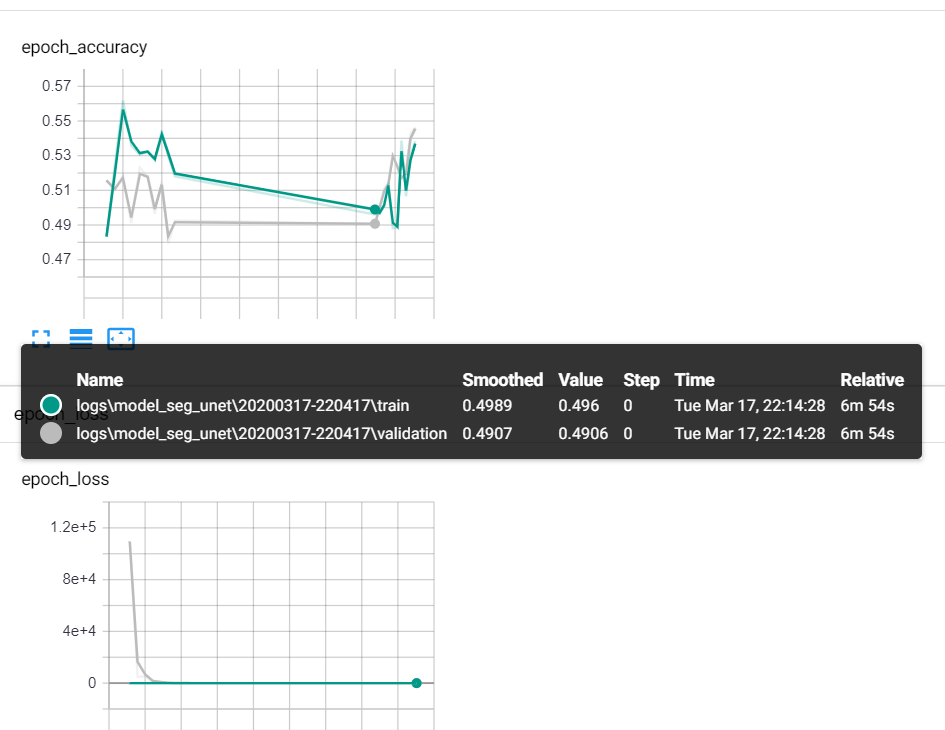

#### Aslo try with  data segmenting with size = 64 and stride = 16 

In [82]:
train_seg_fk_64 = 'data_segmented_64/train/fake/'
test_seg_fk_64 = 'data_segmented_64/test/fake/'
val_seg_fk_64 = 'data_segmented_64/val/fake/'

In [127]:
if not os.path.isdir('data_segmented_64'):
    os.makedirs(train_seg_fk_64)
    os.makedirs(test_seg_fk_64)
    os.makedirs(val_seg_fk_64)

In [128]:
fake_segmet_on_datasplit(dest_path=train_seg_fk_64,
                         split_type=X_train,
                         kernel_size=64,stride=16)

fake_segmet_on_datasplit(dest_path=val_seg_fk_64,
                         split_type=X_val,
                         kernel_size=64,stride=16)

fake_segmet_on_datasplit(dest_path=test_seg_fk_64,
                         split_type=X_test,
                         kernel_size=64,stride=16)

In [129]:
print("Total segmented samples derived from FAKE images from TRIAN DATA: {}".format(len(os.listdir(train_seg_fk_64))/int(2)))
print("Total segmented samples derived from FAKE images from TEST DATA: {}".format(len(os.listdir(test_seg_fk_64))/int(2)))
print("Total segmented samples derived from FAKE images from VALIDATION DATA: {}".format(len(os.listdir(val_seg_fk_64))/int(2)))

Total segmented samples derived from FAKE images from TRIAN DATA: 36762.0
Total segmented samples derived from FAKE images from TEST DATA: 9759.0
Total segmented samples derived from FAKE images from VALIDATION DATA: 8604.0


In [83]:
def collect_to_df(path):
    data_df = pd.DataFrame()
    X_label = []
    y_label = []
    for i in (list({i.split('.')[0] for i in os.listdir(path)})):
        X_label.append(path+i+'.png')
        y_label.append(path+i+'.mask.png')  

    data_df['X']  =  X_label 
    data_df['y']  =  y_label 
    data_df = shuffle(data_df)
    data_df.reset_index(inplace=True, drop=True)
    return data_df

In [84]:
train_seg_64_data  = collect_to_df(path=train_seg_fk_64)
test_seg_64_data  = collect_to_df(path=test_seg_fk_64)
val_seg_64_data  = collect_to_df(path=val_seg_fk_64)

In [87]:
train_seg_64_data.to_csv('train_seg_64_data.csv',index=False)
test_seg_64_data.to_csv('test_seg_64_data.csv',index=False)
val_seg_64_data.to_csv('val_seg_64_data.csv',index=False)

In [86]:
input_img = Input((64, 64, 3))
model_seg_64_unet = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model_seg_64_unet.compile(optimizer=keras.optimizers.Adam(), loss="binary_crossentropy", metrics=["accuracy"])
model_seg_64_unet.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_76 (Conv2D)              (None, 64, 64, 16)   448         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_72 (BatchNo (None, 64, 64, 16)   64          conv2d_76[0][0]                  
__________________________________________________________________________________________________
activation_72 (Activation)      (None, 64, 64, 16)   0           batch_normalization_72[0][0]     
____________________________________________________________________________________________

In [89]:
checkPoint_path = "model_checkpoints/model_seg_64_unet/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_seg_64_unet\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [90]:
batch_size = 8
max_epochs = 10

history = model_seg_64_unet.fit_generator(generator = data_seg_gen(train_seg_64_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_seg_gen(val_seg_64_data),
                    validation_steps=16,callbacks=callbacks_list)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 16 steps, validate for 16 steps
Epoch 1/10
15/16 [===========================>..] - ETA: 0s - loss: 0.6980 - accuracy: 0.5062
Epoch 00001: val_accuracy improved from -inf to 0.50935, saving model to model_checkpoints/model_seg_64_unet/weights-improvement-01-0.51.hdf5
16/16 [==============================] - 7s 451ms/step - loss: 0.6973 - accuracy: 0.5072 - val_loss: 0.7861 - val_accuracy: 0.5094
Epoch 2/10
15/16 [===========================>..] - ETA: 0s - loss: 0.6907 - accuracy: 0.5276
Epoch 00002: val_accuracy improved from 0.50935 to 0.51790, saving model to model_checkpoints/model_seg_64_unet/weights-improvement-02-0.52.hdf5
16/16 [==============================] - 7s 454ms/step - loss: 0.6906 - accuracy: 0.5300 - val_loss: 0.7447 - val_accuracy: 0.5179
Epoch 3/10
15/16 [===========================>..] - ETA: 0s - loss: 0.6894 - accuracy: 0.5262
Epoch 00003: val_accuracy did not improve from 0.51790
16/16 [===============

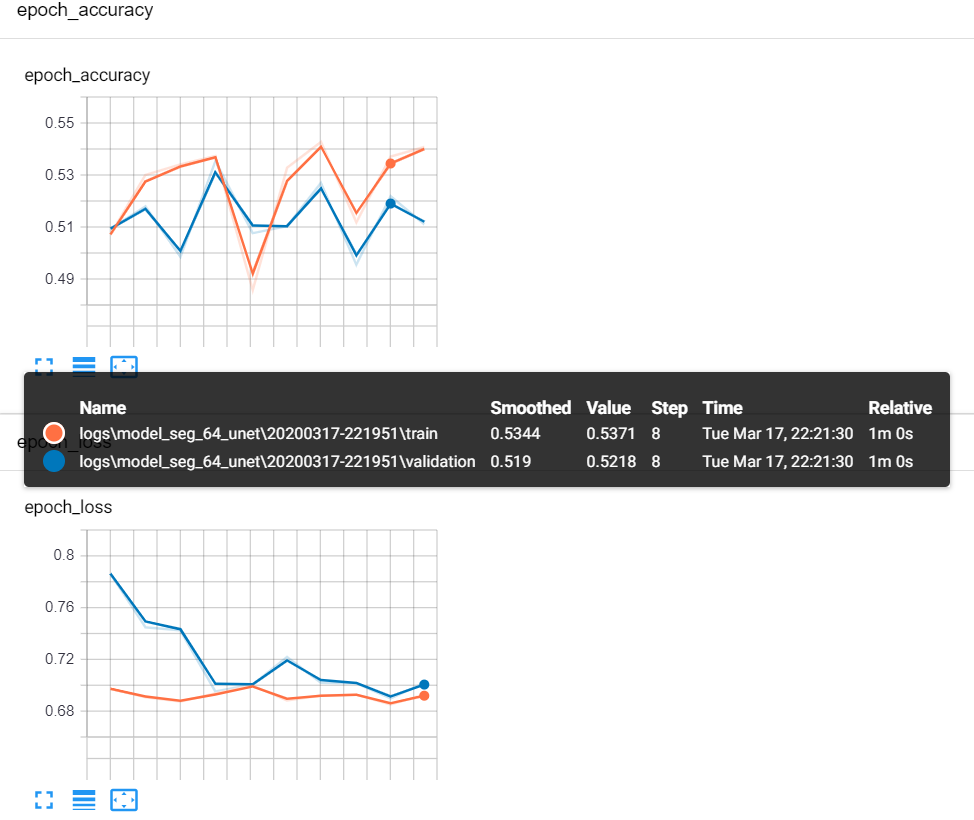